
image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/all_dataset_singleclass/images/train/7_days_vanilla__48794101022__4_frame_004_png.rf.44de629e212cf183a8581dd51fe963fb.jpg: 640x640 1 object, 21.0ms
Speed: 1.2ms preprocess, 21.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
img.shape: (640, 640, 3) mask shape: (1, 640, 640)


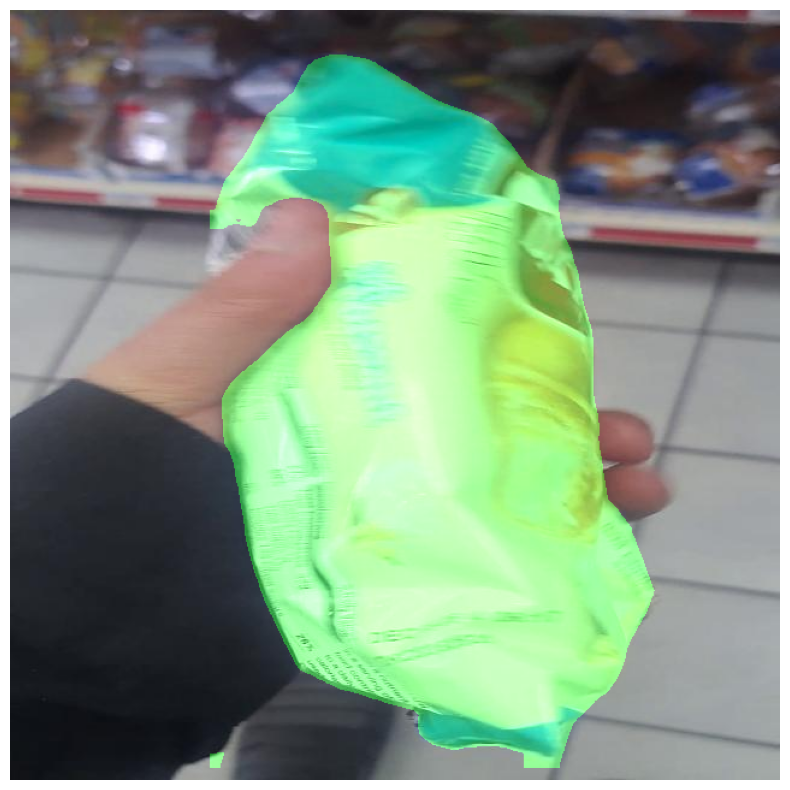

In [5]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import numpy as np
import cv2

# ==== EDIT THESE ====
MODEL_PATH = "runs/train/all_dataset_singleclass_sam/weights/best.pt"
IMAGE_PATH = "/home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/all_dataset_singleclass/images/train/7_days_vanilla__48794101022__4_frame_004_png.rf.44de629e212cf183a8581dd51fe963fb.jpg"
# ====================

model = YOLO(MODEL_PATH)
results = model(IMAGE_PATH, conf=CONFIDENCE)

r = results[0]
img = r.orig_img.copy()  # shape: (H, W, 3)
mask_overlay = img.copy()

if hasattr(r, 'masks') and r.masks is not None:
    # Get mask array; some casts
    masks = r.masks.data.cpu().numpy() if hasattr(r.masks.data, 'cpu') else r.masks.data
    # masks shape: (N_instances, H_mask, W_mask)
    print("img.shape:", img.shape, "mask shape:", masks.shape)

    for i, m in enumerate(masks):
        # If mask size ≠ img size, resize it
        if (m.shape[0], m.shape[1]) != (img.shape[0], img.shape[1]):
            m = cv2.resize(m.astype(np.uint8), (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)
            # ensure binary mask 0/1
            m = (m > 0.5).astype(np.uint8)

        color = (0, 255, 0)
        overlay = np.zeros_like(img, dtype=np.uint8)
        overlay[m == 1] = color
        alpha = 0.4
        mask_overlay = cv2.addWeighted(mask_overlay, 1.0, overlay, alpha, 0)

else:
    print("No masks found in results. Make sure you used a segmentation model version.")

plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(mask_overlay, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


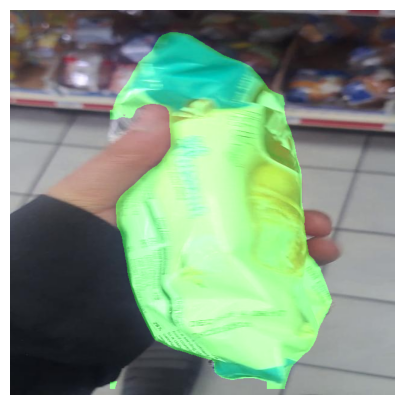

In [6]:
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(mask_overlay, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

In [7]:
import glob
images = glob.glob('../../../shwan_data/scripts/all_frames/*/*')
len(images)

5792


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/lucky_charms__16000506015__10/lucky_charms__16000506015__10_frame_035.png: 640x384 1 object, 19.7ms
Speed: 5.7ms preprocess, 19.7ms inference, 11.4ms postprocess per image at shape (1, 3, 640, 384)


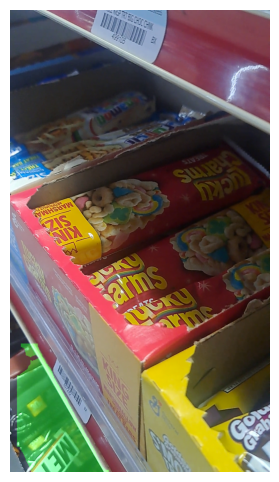


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/twisted_tea_black_cherry__87692010753__9/twisted_tea_black_cherry__87692010753__9_frame_025.png: 640x384 15 objects, 16.2ms
Speed: 1.5ms preprocess, 16.2ms inference, 32.4ms postprocess per image at shape (1, 3, 640, 384)


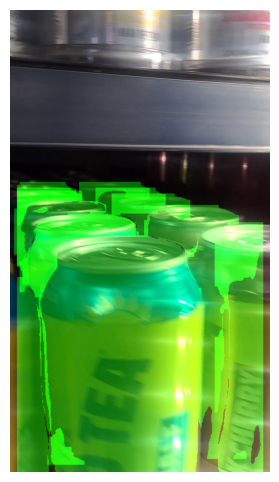


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/little_tree_leather__76171222909__2/little_tree_leather__76171222909__2_frame_047.png: 640x384 (no detections), 15.8ms
Speed: 1.5ms preprocess, 15.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/little_tree_leather__76171222909__2/little_tree_leather__76171222909__2_frame_047.png


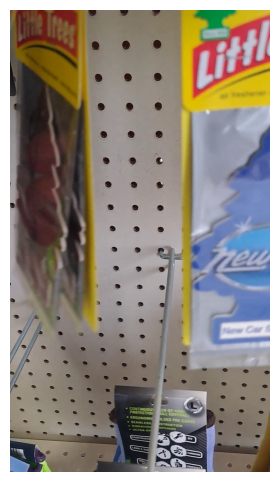


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/chips_deluxe__27800062700__5/chips_deluxe__27800062700__5_frame_054.png: 640x384 (no detections), 16.0ms
Speed: 1.5ms preprocess, 16.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/chips_deluxe__27800062700__5/chips_deluxe__27800062700__5_frame_054.png


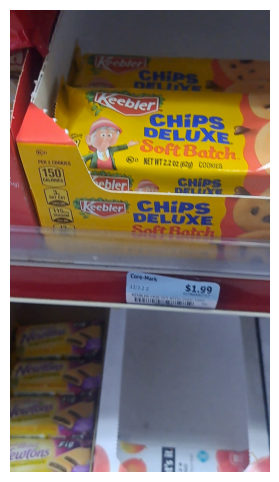


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/segrams_vo__88004037222__8/segrams_vo__88004037222__8_frame_056.png: 640x384 (no detections), 16.6ms
Speed: 1.5ms preprocess, 16.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/segrams_vo__88004037222__8/segrams_vo__88004037222__8_frame_056.png


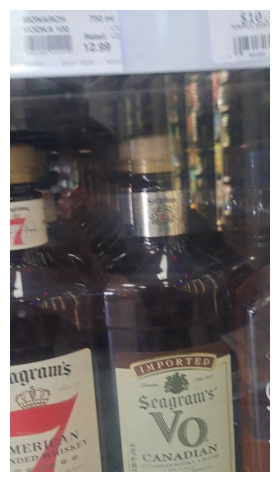


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/hand_warmers__24291164081__11/hand_warmers__24291164081__11_frame_057.png: 640x384 (no detections), 16.8ms
Speed: 1.7ms preprocess, 16.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/hand_warmers__24291164081__11/hand_warmers__24291164081__11_frame_057.png


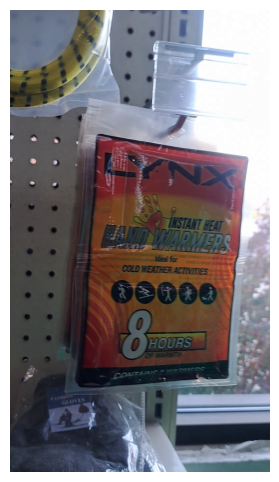


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/finest_call_sweet___sour__70491806955__1/finest_call_sweet___sour__70491806955__1_frame_010.png: 640x384 4 objects, 15.9ms
Speed: 1.5ms preprocess, 15.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 384)


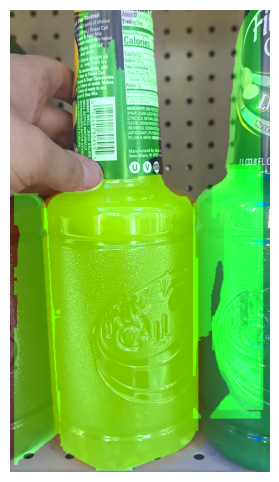


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/Columbia_valley__848375002379__1/Columbia_valley__848375002379__1_frame_009.png: 640x384 (no detections), 18.3ms
Speed: 1.5ms preprocess, 18.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/Columbia_valley__848375002379__1/Columbia_valley__848375002379__1_frame_009.png


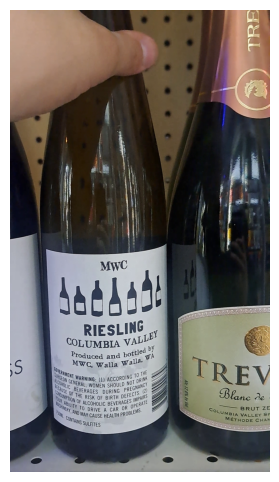


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/finest_call_huckleberry__70491548008__4/finest_call_huckleberry__70491548008__4_frame_037.png: 640x384 3 objects, 15.8ms
Speed: 1.5ms preprocess, 15.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 384)


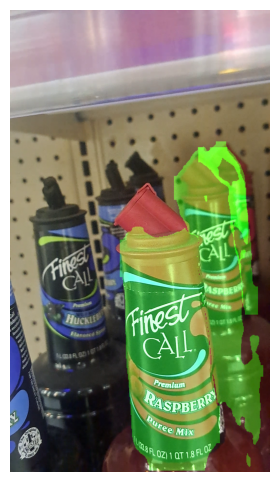


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/finest_call_mango__70491112209__5/finest_call_mango__70491112209__5_frame_045.png: 640x384 3 objects, 15.7ms
Speed: 1.6ms preprocess, 15.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 384)


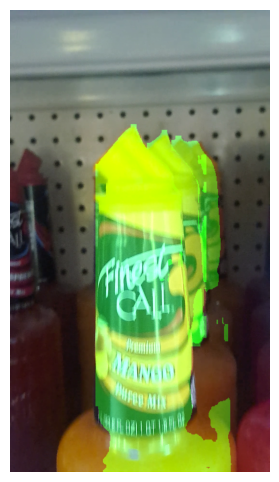


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/twisted_tea_razzberry__87692852315__9/twisted_tea_razzberry__87692852315__9_frame_053.png: 640x384 4 objects, 15.9ms
Speed: 1.5ms preprocess, 15.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 384)


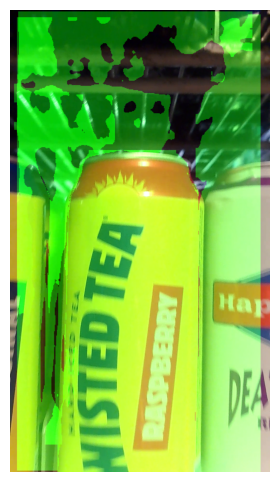


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/little_tree_black_ice__76171220554__5/little_tree_black_ice__76171220554__5_frame_041.png: 640x384 (no detections), 16.5ms
Speed: 1.5ms preprocess, 16.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/little_tree_black_ice__76171220554__5/little_tree_black_ice__76171220554__5_frame_041.png


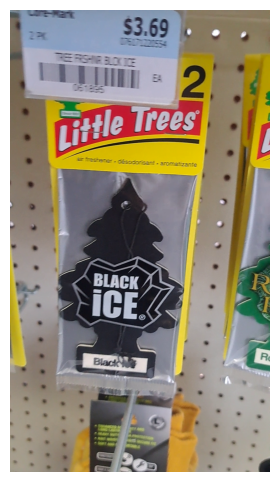


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/mikes_harder_mango__635985258919__9/mikes_harder_mango__635985258919__9_frame_005.png: 640x384 (no detections), 16.2ms
Speed: 1.5ms preprocess, 16.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/mikes_harder_mango__635985258919__9/mikes_harder_mango__635985258919__9_frame_005.png


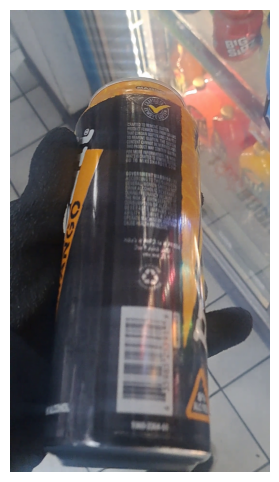


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/nature_valley__16000264694__7/nature_valley__16000264694__7_frame_045.png: 640x384 3 objects, 16.3ms
Speed: 1.6ms preprocess, 16.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 384)


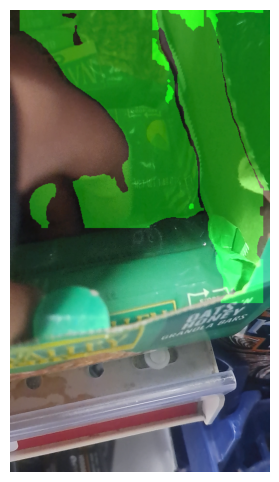


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/Pendleton__811538019323__6/Pendleton__811538019323__6_frame_054.png: 640x384 2 objects, 16.1ms
Speed: 1.6ms preprocess, 16.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 384)


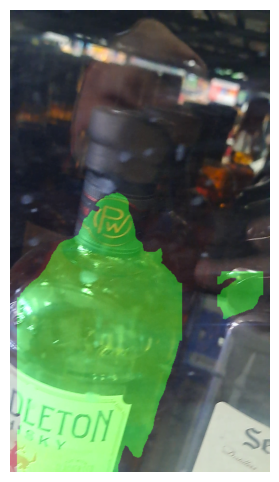


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/clif_crunchy__722252101204__4/clif_crunchy__722252101204__4_frame_015.png: 640x384 (no detections), 16.0ms
Speed: 1.6ms preprocess, 16.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/clif_crunchy__722252101204__4/clif_crunchy__722252101204__4_frame_015.png


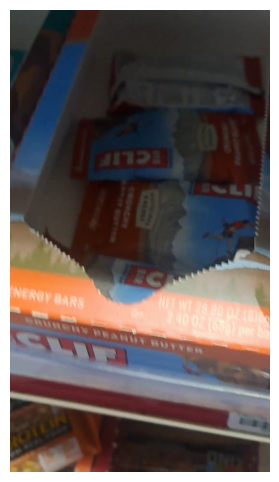


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/segrams_vo__88004037222__8/segrams_vo__88004037222__8_frame_030.png: 640x384 4 objects, 16.1ms
Speed: 1.5ms preprocess, 16.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 384)


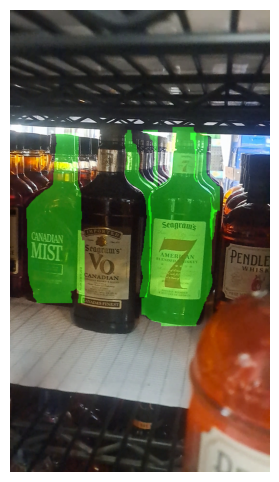


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/zingers_raspberry__888109010089__6/zingers_raspberry__888109010089__6_frame_042.png: 640x384 4 objects, 21.6ms
Speed: 2.1ms preprocess, 21.6ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 384)


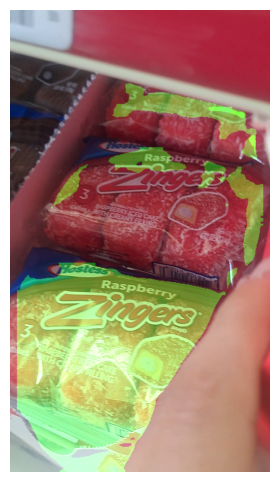


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/Columbia_valley__848375002379__1/Columbia_valley__848375002379__1_frame_028.png: 640x384 1 object, 16.6ms
Speed: 1.6ms preprocess, 16.6ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 384)


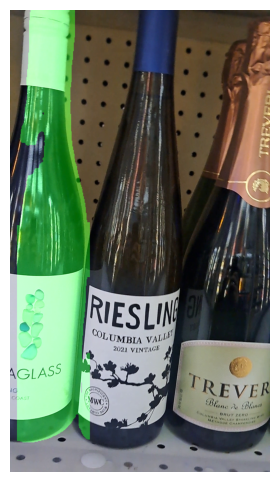


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/finest_call_sweet___sour__70491806955__1/finest_call_sweet___sour__70491806955__1_frame_056.png: 640x384 3 objects, 16.0ms
Speed: 1.6ms preprocess, 16.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 384)


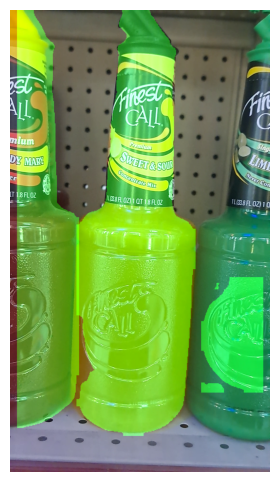


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/kungfu_girl__83120015048__1/kungfu_girl__83120015048__1_frame_011.png: 640x384 (no detections), 15.6ms
Speed: 1.5ms preprocess, 15.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/kungfu_girl__83120015048__1/kungfu_girl__83120015048__1_frame_011.png


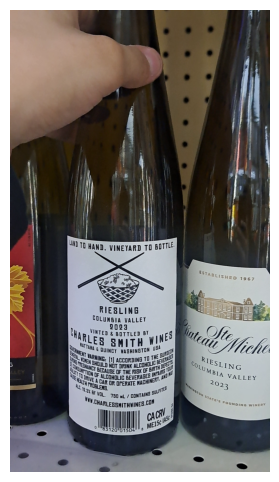


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/r_and_r__88004000394__14/r_and_r__88004000394__14_frame_008.png: 640x384 (no detections), 16.5ms
Speed: 1.5ms preprocess, 16.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/r_and_r__88004000394__14/r_and_r__88004000394__14_frame_008.png


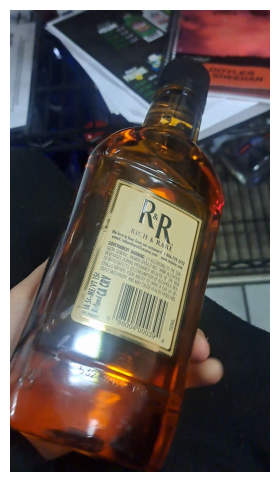


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/jack_Daniels__82184090466__11/jack_Daniels__82184090466__11_frame_047.png: 640x384 (no detections), 15.9ms
Speed: 1.5ms preprocess, 15.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/jack_Daniels__82184090466__11/jack_Daniels__82184090466__11_frame_047.png


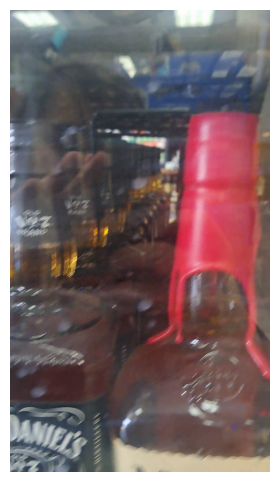


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/barefoot_Riesling__85000015810__1/barefoot_Riesling__85000015810__1_frame_015.png: 640x384 (no detections), 15.8ms
Speed: 1.6ms preprocess, 15.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/barefoot_Riesling__85000015810__1/barefoot_Riesling__85000015810__1_frame_015.png


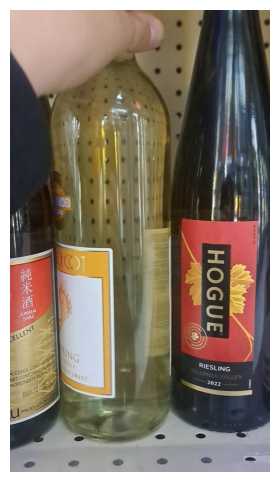


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/jack_Daniel_s_apple__82184004371__9/jack_Daniel_s_apple__82184004371__9_frame_014.png: 640x384 1 object, 16.2ms
Speed: 1.5ms preprocess, 16.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


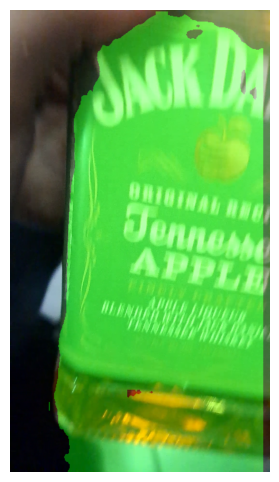


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/7_days_vanilla__48794101022__4/7_days_vanilla__48794101022__4_frame_060.png: 640x384 5 objects, 21.7ms
Speed: 1.7ms preprocess, 21.7ms inference, 23.2ms postprocess per image at shape (1, 3, 640, 384)


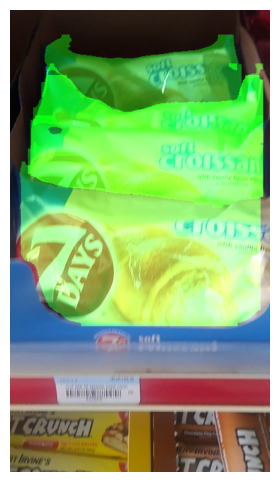


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/tire_repair_kit__80893010355__1/tire_repair_kit__80893010355__1_frame_005.png: 640x384 (no detections), 15.8ms
Speed: 1.5ms preprocess, 15.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/tire_repair_kit__80893010355__1/tire_repair_kit__80893010355__1_frame_005.png


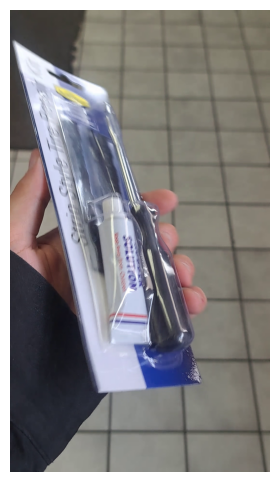


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/bulbs__80893010140__3/bulbs__80893010140__3_frame_041.png: 640x384 (no detections), 15.8ms
Speed: 1.5ms preprocess, 15.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/bulbs__80893010140__3/bulbs__80893010140__3_frame_041.png


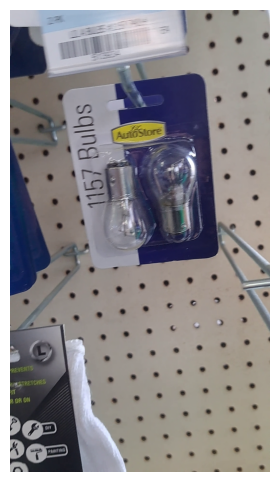


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/Gruet__701253006008___1/Gruet__701253006008___1_frame_020.png: 640x384 1 object, 16.0ms
Speed: 1.5ms preprocess, 16.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 384)


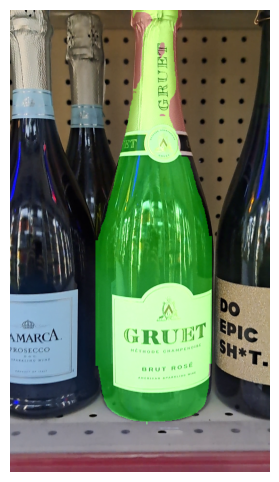


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/jack_Daniels__82184090466__11/jack_Daniels__82184090466__11_frame_004.png: 640x384 1 object, 15.6ms
Speed: 1.5ms preprocess, 15.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 384)


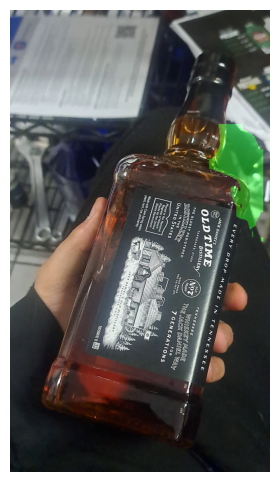


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/clif_peanut_butter_banana__722252160195__8/clif_peanut_butter_banana__722252160195__8_frame_031.png: 640x384 (no detections), 16.5ms
Speed: 1.5ms preprocess, 16.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/clif_peanut_butter_banana__722252160195__8/clif_peanut_butter_banana__722252160195__8_frame_031.png


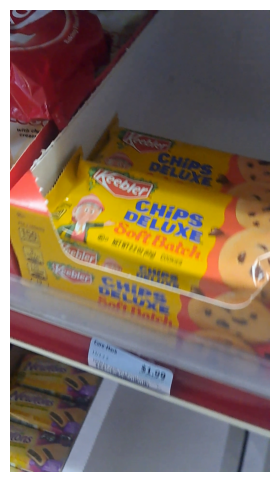


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/McNaughton__96749003280__3/McNaughton__96749003280__3_frame_047.png: 640x384 3 objects, 16.4ms
Speed: 1.6ms preprocess, 16.4ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 384)


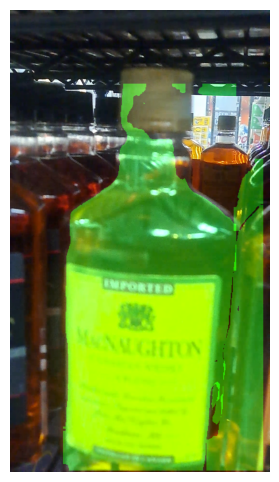


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/Buckhead_orange__80692950968__1/Buckhead_orange__80692950968__1_frame_009.png: 640x384 3 objects, 16.6ms
Speed: 1.6ms preprocess, 16.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 384)


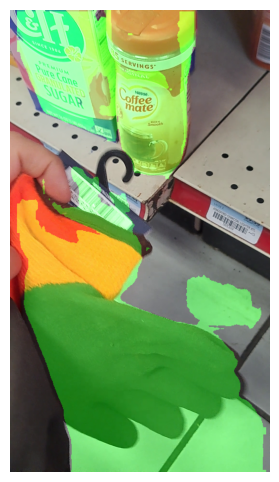


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/twisted_tea_extreme__87692017837__4/twisted_tea_extreme__87692017837__4_frame_045.png: 640x384 10 objects, 16.3ms
Speed: 1.5ms preprocess, 16.3ms inference, 6.6ms postprocess per image at shape (1, 3, 640, 384)


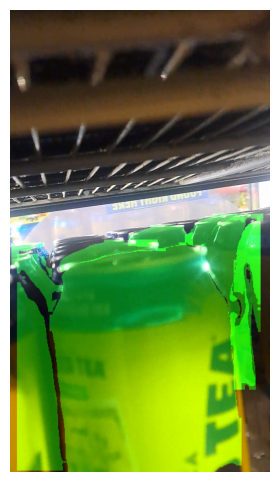


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/twisted_tea_half_and_half__87692752318__17/twisted_tea_half_and_half__87692752318__17_frame_021.png: 640x384 22 objects, 17.0ms
Speed: 1.6ms preprocess, 17.0ms inference, 15.5ms postprocess per image at shape (1, 3, 640, 384)


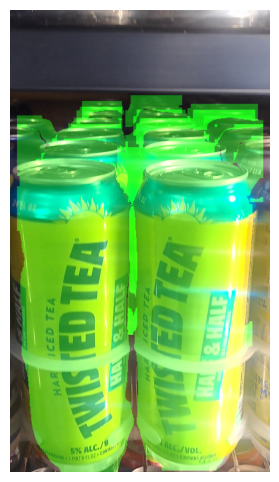


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/gaucho_yellow__80692950074__3/gaucho_yellow__80692950074__3_frame_035.png: 640x384 (no detections), 16.4ms
Speed: 1.5ms preprocess, 16.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/gaucho_yellow__80692950074__3/gaucho_yellow__80692950074__3_frame_035.png


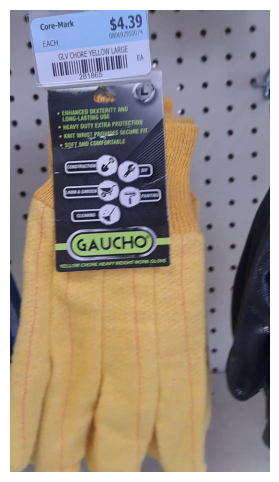


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/Blackwoods_Russian_cream_5__71610302792__4/Blackwoods_Russian_cream_5__71610302792__4_frame_018.png: 640x384 6 objects, 16.2ms
Speed: 1.6ms preprocess, 16.2ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 384)


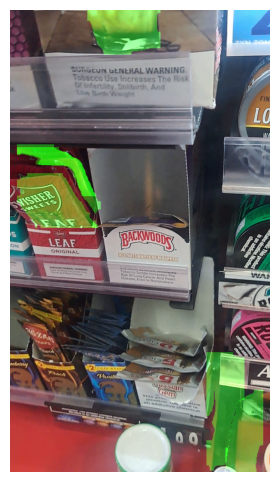


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/mikes_harder_hurricane_punch__635985803096__9/mikes_harder_hurricane_punch__635985803096__9_frame_011.png: 640x384 2 objects, 16.2ms
Speed: 1.6ms preprocess, 16.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 384)


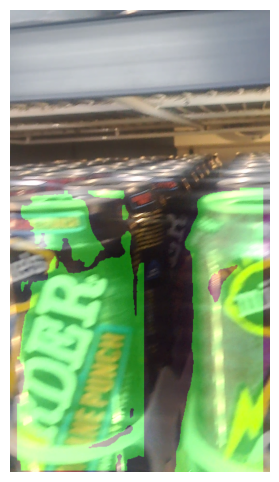


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/nature_valley_almond__16000442818__9/nature_valley_almond__16000442818__9_frame_008.png: 640x384 2 objects, 16.1ms
Speed: 1.6ms preprocess, 16.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 384)


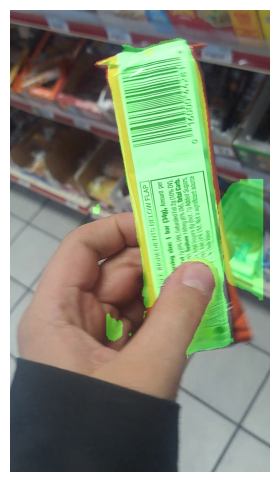


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/do_epic__701253000525__1/do_epic__701253000525__1_frame_054.png: 640x384 (no detections), 16.3ms
Speed: 1.5ms preprocess, 16.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/do_epic__701253000525__1/do_epic__701253000525__1_frame_054.png


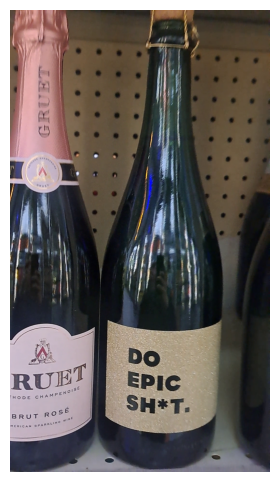


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/mikes_harder_hurricane_punch__635985803096__9/mikes_harder_hurricane_punch__635985803096__9_frame_021.png: 640x384 34 objects, 16.5ms
Speed: 1.6ms preprocess, 16.5ms inference, 18.6ms postprocess per image at shape (1, 3, 640, 384)


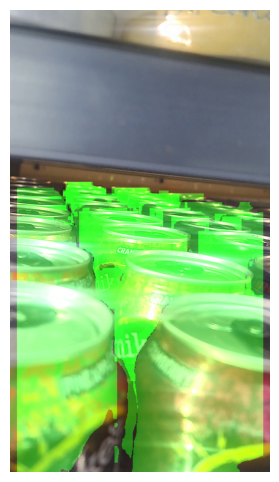


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/Lamarca__85000017739__2/Lamarca__85000017739__2_frame_016.png: 640x384 1 object, 16.0ms
Speed: 1.6ms preprocess, 16.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 384)


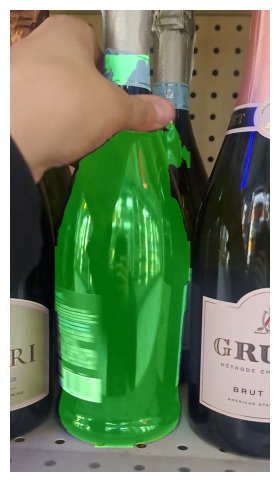


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/chateau_Michelle_Riesling__88586621840__1/chateau_Michelle_Riesling__88586621840__1_frame_004.png: 640x384 (no detections), 16.3ms
Speed: 1.5ms preprocess, 16.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/chateau_Michelle_Riesling__88586621840__1/chateau_Michelle_Riesling__88586621840__1_frame_004.png


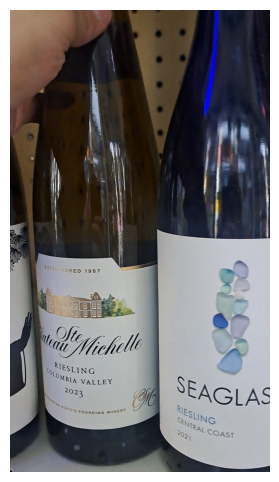


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/7_days_mini_croissants__816374020670__5/7_days_mini_croissants__816374020670__5_frame_019.png: 640x384 (no detections), 15.8ms
Speed: 1.5ms preprocess, 15.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/7_days_mini_croissants__816374020670__5/7_days_mini_croissants__816374020670__5_frame_019.png


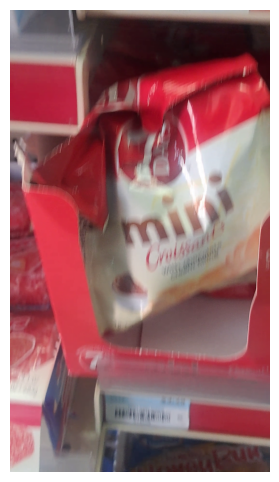


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/Pendleton__811538019323__6/Pendleton__811538019323__6_frame_051.png: 640x384 1 object, 16.3ms
Speed: 1.5ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 384)


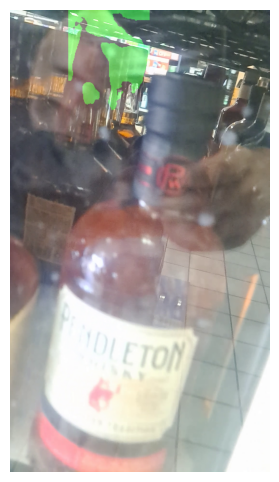


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/hakutsuru__747846010144__2/hakutsuru__747846010144__2_frame_040.png: 640x384 (no detections), 15.9ms
Speed: 1.5ms preprocess, 15.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/hakutsuru__747846010144__2/hakutsuru__747846010144__2_frame_040.png


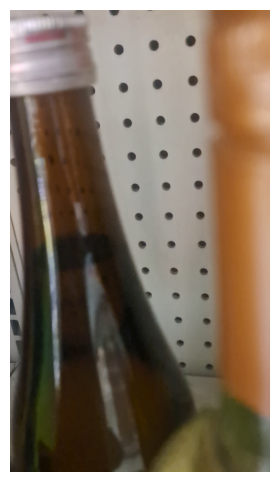


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/twisted_tea_black_cherry__87692010753__9/twisted_tea_black_cherry__87692010753__9_frame_035.png: 640x384 19 objects, 15.7ms
Speed: 1.5ms preprocess, 15.7ms inference, 10.3ms postprocess per image at shape (1, 3, 640, 384)


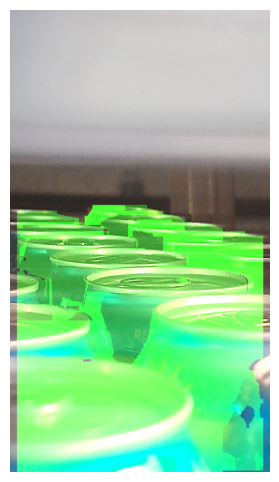


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/lucky_charms__16000506015__10/lucky_charms__16000506015__10_frame_011.png: 640x384 (no detections), 15.7ms
Speed: 1.5ms preprocess, 15.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)
No mask found: ../../../shwan_data/scripts/all_frames/lucky_charms__16000506015__10/lucky_charms__16000506015__10_frame_011.png


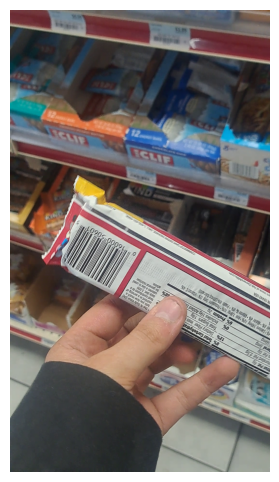


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/twisted_tea_black_cherry__87692010753__9/twisted_tea_black_cherry__87692010753__9_frame_022.png: 640x384 23 objects, 16.0ms
Speed: 1.5ms preprocess, 16.0ms inference, 12.1ms postprocess per image at shape (1, 3, 640, 384)


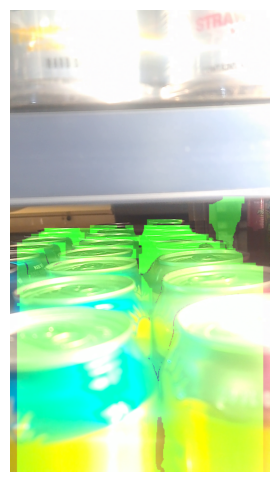


image 1/1 /home/ubuntu/additional_drive/shwan_data/auto_annotations/temp_yolo/../../../shwan_data/scripts/all_frames/jack_Daniel_s_honey__82184000335__10/jack_Daniel_s_honey__82184000335__10_frame_049.png: 640x384 2 objects, 18.1ms
Speed: 2.1ms preprocess, 18.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 384)


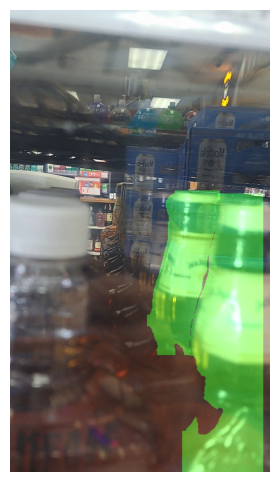

In [8]:
import glob
import random
from ultralytics import YOLO
import matplotlib.pyplot as plt
import numpy as np
import cv2

# ==== EDIT THIS ====
MODEL_PATH = "runs/train/all_dataset_singleclass_sam/weights/best.pt"
CONFIDENCE = 0.25
# ===================

# Load model once
model = YOLO(MODEL_PATH)

# Load all images
images = glob.glob('../../../shwan_data/scripts/all_frames/*/*')

# Randomly select 50
random_50 = random.sample(images, 50)

for img_path in random_50:
    # Run YOLO (segmentation)
    results = model(img_path, conf=CONFIDENCE)
    r = results[0]

    img = r.orig_img.copy()
    mask_overlay = img.copy()

    # Process masks
    if hasattr(r, "masks") and r.masks is not None:
        masks = r.masks.data.cpu().numpy() if hasattr(r.masks.data, "cpu") else r.masks.data

        for m in masks:
            # Resize mask to image size if needed
            if (m.shape[0], m.shape[1]) != (img.shape[0], img.shape[1]):
                m = cv2.resize(
                    m.astype(np.uint8),
                    (img.shape[1], img.shape[0]),
                    interpolation=cv2.INTER_NEAREST
                )
                m = (m > 0.5).astype(np.uint8)

            # Green overlay
            color = (0, 255, 0)
            overlay = np.zeros_like(img, dtype=np.uint8)
            overlay[m == 1] = color

            alpha = 0.4
            mask_overlay = cv2.addWeighted(mask_overlay, 1.0, overlay, alpha, 0)

    else:
        print("No mask found:", img_path)

    # Show masked image
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(mask_overlay, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

    # Separator
    print("=" * 100)
